# Final Project Notebook

DS 5001 Exploratory Text Analytics | Spring 2024

# Metadata

- Full Name: Gwen Powers
- Userid: gp8cf
- GitHub Repo URL: https://github.com/gwenpowers1/ETA_finalproject
- UVA Box URL: https://virginia.box.com/s/shpyl5sie1cefby7cfg0qp84gvo5p2ty

# Overview

The goal of the final project is for you to create a **digital analytical edition** of a corpus using the tools, practices, and perspectives you’ve learning in this course. You will select a corpus that has already been digitized and transcribed, parse that into an F-compliant set of tables, and then generate and visualize the results of a series of fitted models. You will also draw some tentative conclusions regarding the linguistic, cultural, psychological, or historical features represented by your corpus. The point of the exercise is to have you work with a corpus through the entire pipeline from ingestion to interpretation. 

Specifically, you will acquire a collection of long-form texts and perform the following operations:

- **Convert** the collection from their source formats (F0) into a set of tables that conform to the Standard Text Analytic Data Model (F2).
- **Annotate** these tables with statistical and linguistic features using NLP libraries such as NLTK (F3).
- **Produce** a vector representation of the corpus to generate TFIDF values to add to the TOKEN (aka CORPUS) and VOCAB tables (F4).
- **Model** the annotated and vectorized model with tables and features derived from the application of unsupervised methods, including PCA, LDA, and word2vec (F5).
- **Explore** your results using statistical and visual methods.
- **Present** conclusions about patterns observed in the corpus by means of these operations.

When you are finished, you will make the results of your work available in GitHub (for code) and UVA Box (for data). You will submit to Gradescope (via Canvas) a PDF version of a Jupyter notebook that contains the information listed below.

# Some Details

- Please fill out your answers in each task below by editing the markdown cell. 
- Replace text that asks you to insert something with the thing, i.e. replace `(INSERT IMAGE HERE)` with an image element, e.g. `![](image.png)`.
- For URLs, just paste the raw URL directly into the text area. Don't worry about providing link labels using `[label](link)`.
- Please do not alter the structure of the document or cell, i.e. the bulleted lists. 
- You may add explanatory paragraphs below the bulleted lists.
- Please name your tables as they are named in each task below.
- Tasks are indicated by headers with point values in parentheses.

# Raw Data

## Source Description (1)

Provide a brief description of your source material, including its provenance and content. Tell us where you found it and what kind of content it contains.

##### I found the entire set of original Nancy Drew Mystery novels on an archive website that had the works split by book in a variety of different formats. I chose txt files for this project, and I found them to be pretty well organized, requiring only minor tweaking and cleaning of systematic typos. I also took the liberty of adding the ghost author and publication dates from what I could find online in order to provide more features for my analysis.

## Source Features (1)

Add values for the following items. (Do this for all following bulleted lists.)

- Source URL: https://archive.org/details/nancydrew/001%20The%20Secret%20of%20the%20Old%20Clock/page/n133/mode/2up
- UVA Box URL: https://virginia.box.com/s/shpyl5sie1cefby7cfg0qp84gvo5p2ty
- Number of raw documents: 12
- Total size of raw documents (e.g. in MB): 2.429 MB
- File format(s), e.g. XML, plaintext, etc.: txt files

## Source Document Structure (1)

Provide a brief description of the internal structure of each document. That, describe the typical elements found in document and their relation to each other. For example, a corpus of letters might be described as having a date, an addressee, a salutation, a set of content paragraphs, and closing. If they are various structures, state that.

##### Each document is a Nancy Drew Mystery novel that has a title, author, ghost author, a set of chapters, and a publication date. 

# Parsed and Annotated Data

Parse the raw data into the three core tables of your addition: the `LIB`, `CORPUS`, and `VOCAB` tables.

These tables will be stored as CSV files with header rows.

You may consider using `|` as a delimitter.

Provide the following information for each.

## LIB (2)

The source documents the corpus comprises. These may be books, plays, newspaper articles, abstracts, blog posts, etc. 

Note that these are *not* documents in the sense used to describe a bag-of-words representation of a text, e.g. chapter.

- UVA Box URL: https://virginia.box.com/s/shpyl5sie1cefby7cfg0qp84gvo5p2ty
- GitHub URL for notebook used to create: https://github.com/gwenpowers1/ETA_finalproject/blob/main/FinalProject.ipynb
- Delimitter: ' '
- Number of observations: 12
- List of features, including at least three that may be used for model summarization (e.g. date, author, etc.): book_id, source_file_path, title, author, ghost_author, publication_date, (added book_len and n_chaps and names_in_book after making CORPUS)
- Average length of each document in characters: 42974.5

In [1]:
import pandas as pd
import numpy as np
from glob import glob
import re
import nltk

In [2]:
source_files = f'nancy_drew_files'

In [3]:
chapter_pattern = rf"^CHAPTER\s+[IVXLCM]+\.\s*$"

In [4]:
source_file_list = sorted(glob(f"{source_files}/*.*"))

In [5]:
source_file_list

['nancy_drew_files/001 The Secret of the Old Clock_djvu.txt',
 'nancy_drew_files/002 The Hidden Staircase_djvu.txt',
 'nancy_drew_files/003 The Bungalow Mystery_djvu.txt',
 'nancy_drew_files/004 The Mystery at Lilac Inn_djvu.txt',
 'nancy_drew_files/005 The Secret of Shadow Ranch_djvu.txt',
 'nancy_drew_files/006 The Secret of Red Gate Farm_djvu.txt',
 'nancy_drew_files/007 The Clue in the Diary_djvu.txt',
 "nancy_drew_files/008 Nancy's Mysterious Letter_djvu.txt",
 'nancy_drew_files/009 The Sign of the Twisted Candles_djvu.txt',
 'nancy_drew_files/010 Password to Larkspur Lane_djvu.txt',
 'nancy_drew_files/011 The Clue of the Broken Locket_djvu.txt',
 'nancy_drew_files/012 The Message in the Hollow Oak_djvu.txt']

In [6]:
book_data = []
for idx, source_file_path in enumerate(source_file_list):
    book_id = idx + 1
    # Open and read the file
    with open(source_file_path, 'r', encoding='utf-8') as file:
        text = file.read()
        # Extract title, author, and publication year
        title_search = re.search(r'(.*)\nBy', text)
        author_search = re.search(r'By (.*) \((.*)\)', text)
        publication_search = re.search(r'PUBLISHED (\d{4})', text)
        if title_search and author_search and publication_search:
            book_title = title_search.group(1).strip()
            author = author_search.group(1).strip()
            ghost_author = author_search.group(2).strip()
            publication_date = publication_search.group(1).strip()
        else:
            book_title = "Unknown"
            author = "Unknown"
            ghost_author = "Unknown"
            publication_date = "Unknown"
    # Append data tuple to book_data list
    book_data.append((book_id, source_file_path, book_title, author, ghost_author, publication_date))


In [7]:
LIB = pd.DataFrame(book_data, columns=['book_id', 'source_file_path', 'title', 'author', 'ghost_author', 'publication_date'])\
    .set_index('book_id').sort_index()

In [8]:
LIB

,source_file_path,title,author,ghost_author,publication_date
book_id,,,,,
1,nancy_drew_files/001 The Secret of the Old Clo...,THE SECRET OF THE OLD CLOCK,Carolyn Keene,Mildred Wirt,1930
2,nancy_drew_files/002 The Hidden Staircase_djvu...,THE HIDDEN STAIRCASE,Carolyn Keene,Mildred Wirt,1930
3,nancy_drew_files/003 The Bungalow Mystery_djvu...,THE BUNGALOW MYSTERY,Carolyn Keene,Mildred Wirt,1930
4,nancy_drew_files/004 The Mystery at Lilac Inn_...,THE MYSTERY AT LILAC INN,Carolyn Keene,Mildred Wirt,1930
5,nancy_drew_files/005 The Secret of Shadow Ranc...,THE SECRET OF SHADOW RANCH,Carolyn Keene,Mildred Wirt,1931
6,nancy_drew_files/006 The Secret of Red Gate Fa...,THE SECRET OF RED GATE FARM,Carolyn Keene,Mildred Wirt,1931
7,nancy_drew_files/007 The Clue in the Diary_djv...,THE CLUE IN THE DIARY,Carolyn Keene,Mildred Wirt,1932
8,nancy_drew_files/008 Nancy's Mysterious Letter...,NANCY'S MYSTERIOUS LETTER,Carolyn Keene,Walter Karig,1932
9,nancy_drew_files/009 The Sign of the Twisted C...,THE SIGN OF THE TWISTED CANDLES,Carolyn Keene,Walter Karig,1933


### note: added 2 more features to LIB after making CORPUS

## CORPUS (2)

The sequence of word tokens in the corpus, indexed by their location in the corpus and document structures.

- UVA Box URL: https://virginia.box.com/s/shpyl5sie1cefby7cfg0qp84gvo5p2ty
- GitHub URL for notebook used to create: https://github.com/gwenpowers1/ETA_finalproject/blob/main/FinalProject.ipynb
- Delimitter:' '
- Number of observations Between (should be >= 500,000 and <= 2,000,000 observations.): 515,694
- OHCO Structure (as delimitted column names):['book_id', 'chap_num', 'para_num', 'sent_num', 'token_num']
- Columns (as delimitted column names, including `token_str`, `term_str`, `pos`, and `pos_group`):['token_str', 'term_str', 'pos', 'pos_group']

In [9]:
OHCO = ['book_id', 'chap_num', 'para_num', 'sent_num', 'token_num']

In [10]:
from nltk.tokenize import PunktSentenceTokenizer, WordPunctTokenizer
import string

In [11]:
def is_punctuation_or_symbol(token):
    return re.match(r'^[\W_]+$', token) is not None

def custom_tokenize_and_pos_tag(text):
    tokens = WordPunctTokenizer().tokenize(text)
    pos_tags = []
    for token in tokens:
        # Check if the token is punctuation or a special character using a regex that matches non-word characters
        if is_punctuation_or_symbol(token):
            pos_tags.append((token, 'SYM', 'PUNCT'))
        else:
            # Only apply NLTK POS tagger to word-like tokens
            tagged = nltk.pos_tag([token])
            pos_tags.append((token, tagged[0][1], 'UNKNOWN'))  # UNKNOWN is a placeholder for further classification
    return pos_tags

In [12]:
def get_pos_group(pos):
    # Map POS tags to simplified groups
    if pos.startswith('N'):
        return 'NN'
    elif pos.startswith('V'):
        return 'VB'
    elif pos == 'CD':
        return 'CD'
    elif pos == 'SYM':
        return 'PUNCT' 
    else:
        return 'OTHER'

In [13]:
def get_pos_group(pos):
    if pos.startswith('N'):
        return 'NN'
    elif pos.startswith('V'):
        return 'VB'
    elif pos == 'CD':
        return 'CD'
    elif pos == '.':
        return 'PUNCT'  # Ensure punctuation is correctly categorized
    else:
        return 'XX'  # Use for all other categories

In [14]:
def tokenize_text(book_id, filepath):
    with open(filepath, 'r', encoding='utf-8') as f:
        text = f.read()
    
    chapters = text.split("CHAPTER")
    token_data = []
    
    for chap_num, chapter in enumerate(chapters):
        if chap_num == 0:
            continue
        
        paragraphs = chapter.split('\n\n')
        for para_num, paragraph in enumerate(paragraphs):
            if not paragraph.strip():
                continue

            sentences = PunktSentenceTokenizer().tokenize(paragraph)
            for sent_num, sentence in enumerate(sentences):
                tagged_tokens = custom_tokenize_and_pos_tag(sentence)
                for token_num, (token_str, pos, pos_group_placeholder) in enumerate(tagged_tokens):
                    term_str = token_str.lower()
                    pos_group = get_pos_group(pos)  # Apply the correct POS group mapping
                    
                    token_data.append([book_id, chap_num, para_num, sent_num, token_num, token_str, term_str, pos, pos_group])

    columns = ['book_id', 'chap_num', 'para_num', 'sent_num', 'token_num', 'token_str', 'term_str', 'pos', 'pos_group']
    return pd.DataFrame(token_data, columns=columns)

In [15]:
books = []
for book_id, row in LIB.iterrows():
    tokens = tokenize_text(book_id, row['source_file_path'])
    books.append(tokens)

CORPUS = pd.concat(books)
CORPUS.set_index(['book_id', 'chap_num', 'para_num', 'sent_num', 'token_num'], inplace=True)

In [16]:
CORPUS

token_str   term_str  pos  \
book_id chap_num para_num sent_num token_num                              
1       1        0        0        0                  I          i  PRP   
                                   1                The        the   DT   
                                   2             Rescue     rescue   NN   
                 1        0        0              NANCY      nancy  NNP   
                                   1               DREW       drew   NN   
...                                                 ...        ...  ...   
12      20       134      0        19            hollow     hollow   NN   
                                   20               oak        oak   NN   
                                   21                .”         .”  SYM   
                 136      0        0          PUBLISHED  published   NN   
                                   1               1935       1935   CD   

                                             pos_group  
book_id chap_num para_num sent_num token_num            
1       1        0        0        0                XX  
                                   1                XX  
                                   2                NN  
                 1        0        0                NN  
                                   1                NN  
...                                                ...  
12      20       134      0        19               NN  
                                   20               NN  
                                   21               XX  
                 136      0        0                NN  
                                   1                CD  

[515694 rows x 4 columns]

## Update LIB to add more features using CORPUS

In [17]:
LIB['book_len'] = CORPUS.groupby('book_id').term_str.count()

In [18]:
LIB['n_chaps'] = CORPUS.reset_index()[['book_id','chap_num']]\
    .drop_duplicates()\
    .groupby('book_id').chap_num.count()

In [19]:
proper_nouns = CORPUS[(CORPUS['pos'] == 'NNP') | (CORPUS['pos'] == 'NNPS')]
proper_nouns.reset_index(inplace=True)

# Ensure 'book_id' and 'term_str' are available as columns for drop_duplicates
proper_nouns_unique = proper_nouns.drop_duplicates(subset=['book_id', 'term_str'])

# Group by 'book_id' and count unique proper nouns
unique_proper_noun_counts = proper_nouns_unique.groupby('book_id').size()
LIB['names_in_book'] = unique_proper_noun_counts

In [20]:
LIB

,source_file_path,title,author,ghost_author,publication_date,book_len,n_chaps,names_in_book
book_id,,,,,,,,
1,nancy_drew_files/001 The Secret of the Old Clo...,THE SECRET OF THE OLD CLOCK,Carolyn Keene,Mildred Wirt,1930,44305,20,40
2,nancy_drew_files/002 The Hidden Staircase_djvu...,THE HIDDEN STAIRCASE,Carolyn Keene,Mildred Wirt,1930,45401,20,38
3,nancy_drew_files/003 The Bungalow Mystery_djvu...,THE BUNGALOW MYSTERY,Carolyn Keene,Mildred Wirt,1930,41963,20,45
4,nancy_drew_files/004 The Mystery at Lilac Inn_...,THE MYSTERY AT LILAC INN,Carolyn Keene,Mildred Wirt,1930,45103,18,47
5,nancy_drew_files/005 The Secret of Shadow Ranc...,THE SECRET OF SHADOW RANCH,Carolyn Keene,Mildred Wirt,1931,41496,20,32
6,nancy_drew_files/006 The Secret of Red Gate Fa...,THE SECRET OF RED GATE FARM,Carolyn Keene,Mildred Wirt,1931,41353,20,32
7,nancy_drew_files/007 The Clue in the Diary_djv...,THE CLUE IN THE DIARY,Carolyn Keene,Mildred Wirt,1932,41517,20,28
8,nancy_drew_files/008 Nancy's Mysterious Letter...,NANCY'S MYSTERIOUS LETTER,Carolyn Keene,Walter Karig,1932,41712,19,49
9,nancy_drew_files/009 The Sign of the Twisted C...,THE SIGN OF THE TWISTED CANDLES,Carolyn Keene,Walter Karig,1933,43232,20,32


In [21]:
LIB['book_len'].mean()

42974.5

## VOCAB (2)

The unique word types (terms) in the corpus.

- UVA Box URL: https://virginia.box.com/s/shpyl5sie1cefby7cfg0qp84gvo5p2ty
- GitHub URL for notebook used to create: https://github.com/gwenpowers1/ETA_finalproject/blob/main/FinalProject.ipynb
- Delimitter: ' '
- Number of observations: 12,953
- Columns (as delimitted names, including `n`, `p`', `i`, `dfidf`, `porter_stem`, `max_pos` and `max_pos_group`, `stop`):
- Note: Your VOCAB may contain ngrams. If so, add a feature for `ngram_length`.
- List the top 20 significant words in the corpus by DFIDF.

['stationed',
 'swell',
 'paint',
 'coaxed',
 'curtly',
 'unaware',
 'lonely',
 'hazardous',
 'sh',
 'littered',
 'safer',
 'bundle',
 'uttered',
 'skillful',
 'hanging',
 'resounding',
 'tickets',
 'unsuccessful',
 'duck',
 'paneled']

In [22]:
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer

In [23]:
df_counts = CORPUS.reset_index().groupby('term_str')['book_id'].nunique().to_frame('df')

VOCAB = CORPUS['term_str'].value_counts().to_frame('n')
VOCAB.index.name = 'term_str'
VOCAB['n_chars'] = VOCAB.index.str.len()  # Length of each term
VOCAB['p'] = VOCAB['n'] / VOCAB['n'].sum()  # Probability of each term
VOCAB['i'] = -np.log2(VOCAB['p'])  # Information content

VOCAB = VOCAB.merge(df_counts, left_index=True, right_index=True, how='left')
total_documents = CORPUS.reset_index()['book_id'].nunique()
VOCAB['idf'] = np.log2(total_documents / VOCAB['df'])
VOCAB['dfidf'] = VOCAB['df'] * VOCAB['idf']

VOCAB['max_pos'] = CORPUS.groupby('term_str')['pos'].agg(lambda x: x.mode()[0])
VOCAB['max_pos_group'] = CORPUS.groupby('term_str')['pos_group'].agg(lambda x: x.mode()[0])

sw = set(stopwords.words('english'))
VOCAB['stop'] = VOCAB.index.isin(sw).astype(int)

VOCAB['porter_stem'] = VOCAB.index.map(PorterStemmer().stem)

In [24]:
VOCAB

,n,n_chars,p,i,df,idf,dfidf,max_pos,max_pos_group,stop,porter_stem
term_str,,,,,,,,,,,
.,29810,1,0.057806,4.112647,12,0.000000,0.000000,SYM,XX,0,.
the,26764,3,0.051899,4.268150,12,0.000000,0.000000,DT,XX,1,the
",",17680,1,0.034284,4.866325,12,0.000000,0.000000,SYM,XX,0,","
to,11495,2,0.022290,5.487437,12,0.000000,0.000000,TO,XX,1,to
“,10541,1,0.020440,5.612432,10,0.263034,2.630344,SYM,XX,0,“
...,...,...,...,...,...,...,...,...,...,...,...
broncobuster,1,12,0.000002,18.976156,1,3.584963,3.584963,NN,NN,0,broncobust
bulldogger,1,10,0.000002,18.976156,1,3.584963,3.584963,NN,NN,0,bulldogg
salty,1,5,0.000002,18.976156,1,3.584963,3.584963,NN,NN,0,salti


In [25]:
#VOCAB.sort_values(by='dfidf', ascending=False).head(20).index.tolist()

# Derived Tables

## BOW (3)

A bag-of-words representation of the CORPUS.

- UVA Box URL: https://virginia.box.com/s/shpyl5sie1cefby7cfg0qp84gvo5p2ty
- GitHub URL for notebook used to create: https://github.com/gwenpowers1/ETA_finalproject/blob/main/FinalProject.ipynb
- Delimitter: ' '
- Bag (expressed in terms of OHCO levels): chap_num
- Number of observations: 124,263
- Columns (as delimitted names, including `n`, `tfidf`): `n`, `tfidf`

In [26]:
# noticed symbols and stop words were included in top tfidf words so chose to remove them
from nltk.corpus import stopwords
#nltk.download('stopwords')
stop_words = set(stopwords.words('english'))
CORPUS = CORPUS[~CORPUS['term_str'].isin(stop_words)]

CORPUS = CORPUS[~CORPUS['term_str'].str.contains(r"[\W_]+", regex=True)]

In [27]:
def create_bow(CORPUS, bag_columns):
    BOW = CORPUS.groupby(bag_columns + ['term_str'])['term_str'].count().rename('n').reset_index()
    return BOW

def compute_tfidf(BOW):
    # Pivot to create a Document-Term Matrix
    DTCM = BOW.pivot_table(index=['book_id', 'chap_num'], columns='term_str', values='n', aggfunc='sum', fill_value=0)
    TF = DTCM.div(DTCM.sum(axis=1), axis=0)  # Calculate Term Frequency
    DF = DTCM.astype(bool).sum(axis=0)  # Document Frequency
    IDF = np.log((len(DTCM) + 1) / (DF + 1)) + 1  # Inverse Document Frequency
    TFIDF = TF.multiply(IDF, axis=1)  # Term Frequency-Inverse Document Frequency
    return TFIDF.stack().reset_index().rename(columns={0: 'tfidf'})  # Convert back to long format

def merge_tfidf_to_bow(BOW, TFIDF):
    # Merge the TFIDF DataFrame back into BOW
    final_BOW = BOW.merge(TFIDF, on=['book_id', 'chap_num', 'term_str'], how='left')
    return final_BOW

In [28]:
BOW_chap = create_bow(CORPUS, ['book_id', 'chap_num'])
TFIDF_chap = compute_tfidf(BOW_chap)
BOW = merge_tfidf_to_bow(BOW_chap, TFIDF_chap)
BOW.set_index(['book_id', 'chap_num', 'term_str'], inplace=True)
BOW

n     tfidf
book_id chap_num term_str              
1       1        able       4  0.008747
                 across     2  0.003853
                 ada        2  0.008881
                 address    1  0.002991
                 advancing  1  0.005723
...                        ..       ...
12      20       xx         1  0.003348
                 yard       1  0.002722
                 yes        1  0.001091
                 york       1  0.002788
                 young      6  0.006062

[124263 rows x 2 columns]

In [29]:
# checking symbols and stop words are removed
top_tfidf_terms = BOW.sort_values(by='tfidf', ascending=False).head(5)
top_tfidf_terms[['tfidf']]

,,,tfidf
book_id,chap_num,term_str,
4,17,gay,0.153973
1,5,allison,0.150884
9,20,carol,0.128407
1,1,judy,0.127477
3,16,abom,0.124588


## DTM (3)

A represenation of the BOW as a sparse count matrix.
 
- UVA Box URL: https://virginia.box.com/s/shpyl5sie1cefby7cfg0qp84gvo5p2ty
- UVA Box URL of BOW used to generate (if applicable): n/a
- GitHub URL for notebook used to create: https://github.com/gwenpowers1/ETA_finalproject/blob/main/FinalProject.ipynb
- Delimitter:' '
- Bag (expressed in terms of OHCO levels):'book_id','chap_num'

In [30]:
DTM = BOW_chap.reset_index().pivot_table(index=['book_id','chap_num'], columns='term_str',values = 'n', fill_value=0)

In [31]:
DTM

term_str          0  091  1  10  10a  112  12  129  148  1562  ...  yvonne  \
book_id chap_num                                               ...           
1       1         0    0  0   0    0    0   0    0    0     0  ...       0   
        2         0    0  0   0    0    0   0    0    0     0  ...       0   
        3         0    0  0   0    0    0   0    0    0     0  ...       0   
        4         0    0  0   0    0    0   0    0    0     0  ...       0   
        5         0    0  0   0    0    0   0    0    0     0  ...       0   
...              ..  ... ..  ..  ...  ...  ..  ...  ...   ...  ...     ...   
12      16        0    0  0   0    0    0   0    0    0     0  ...       0   
        17        0    0  0   0    0    0   0    0    0     0  ...       0   
        18        0    0  0   0    0    0   0    0    0     0  ...       0   
        19        0    0  0   0    0    0   0    0    0     0  ...       0   
        20        0    0  0   0    0    0   0    0    0     0  ...       0   

term_str          zeal  zero  zest  zigzag  zip  zipped  zipping  zone  zoomed  
book_id chap_num                                                                
1       1            0     0     0       0    0       0        0     0       0  
        2            0     0     0       0    0       0        0     0       0  
        3            0     0     0       0    0       1        0     0       0  
        4            0     0     0       0    0       0        0     0       0  
        5            0     0     0       0    0       0        0     0       0  
...                ...   ...   ...     ...  ...     ...      ...   ...     ...  
12      16           0     0     0       0    0       0        0     0       0  
        17           0     0     0       0    0       0        0     0       0  
        18           0     0     0       0    0       0        0     0       0  
        19           0     0     0       0    0       0        0     0       0  
        20           0     0     0       0    0       0        0     0       0  

[237 rows x 12688 columns]

## TFIDF (3)

A Document-Term matrix with TFIDF values.

- UVA Box URL: https://virginia.box.com/s/shpyl5sie1cefby7cfg0qp84gvo5p2ty
- UVA Box URL of DTM or BOW used to create: n/a
- GitHub URL for notebook used to create: https://github.com/gwenpowers1/ETA_finalproject/blob/main/FinalProject.ipynb
- Delimitter: ' '
- Description of TFIDIF formula ($\LaTeX$ OK):  calculated the Term Frequency-Inverse Document Frequency for each term by dividing the term count by the total terms in the document to get TF, computing DF as the number of documents containing the term, and then calculating IDF as the logarithm of the ratio of the total number of documents plus one to the DF plus one, finally adding one to the result, and multiplying TF by this modified IDF to obtain the TFIDF scores.

In [32]:
TFIDF = BOW.reset_index().pivot_table(index=['book_id','chap_num'], columns='term_str',values = 'tfidf', fill_value=0)

In [33]:
TFIDF

term_str            0  091    1   10  10a  112   12  129  148  1562  ...  \
book_id chap_num                                                     ...   
1       1         0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0  ...   
        2         0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0  ...   
        3         0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0  ...   
        4         0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0  ...   
        5         0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0  ...   
...               ...  ...  ...  ...  ...  ...  ...  ...  ...   ...  ...   
12      16        0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0  ...   
        17        0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0  ...   
        18        0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0  ...   
        19        0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0  ...   
        20        0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0  ...   

term_str          yvonne  zeal  zero  zest  zigzag  zip    zipped  zipping  \
book_id chap_num                                                             
1       1            0.0   0.0   0.0   0.0     0.0  0.0  0.000000      0.0   
        2            0.0   0.0   0.0   0.0     0.0  0.0  0.000000      0.0   
        3            0.0   0.0   0.0   0.0     0.0  0.0  0.004952      0.0   
        4            0.0   0.0   0.0   0.0     0.0  0.0  0.000000      0.0   
        5            0.0   0.0   0.0   0.0     0.0  0.0  0.000000      0.0   
...                  ...   ...   ...   ...     ...  ...       ...      ...   
12      16           0.0   0.0   0.0   0.0     0.0  0.0  0.000000      0.0   
        17           0.0   0.0   0.0   0.0     0.0  0.0  0.000000      0.0   
        18           0.0   0.0   0.0   0.0     0.0  0.0  0.000000      0.0   
        19           0.0   0.0   0.0   0.0     0.0  0.0  0.000000      0.0   
        20           0.0   0.0   0.0   0.0     0.0  0.0  0.000000      0.0   

term_str          zone  zoomed  
book_id chap_num                
1       1          0.0     0.0  
        2          0.0     0.0  
        3          0.0     0.0  
        4          0.0     0.0  
        5          0.0     0.0  
...                ...     ...  
12      16         0.0     0.0  
        17         0.0     0.0  
        18         0.0     0.0  
        19         0.0     0.0  
        20         0.0     0.0  

[237 rows x 12688 columns]

## Reduced and Normalized TFIDF_L2 (3)

A Document-Term matrix with L2 normalized TFIDF values.

- UVA Box URL: https://virginia.box.com/s/shpyl5sie1cefby7cfg0qp84gvo5p2ty
- UVA Box URL of source TFIDF table: n/a
- GitHub URL for notebook used to create: https://github.com/gwenpowers1/ETA_finalproject/blob/main/FinalProject.ipynb
- Delimitter: ' '
- Number of features (i.e. significant words):12688
- Principle of significant word selection:

In [34]:
from sklearn.preprocessing import normalize

tfidf_matrix = TFIDF.values
tfidf_l2_normalized = normalize(tfidf_matrix, norm='l2', axis=1)
TFIDF_L2 = pd.DataFrame(tfidf_l2_normalized, index=TFIDF.index, columns=TFIDF.columns)

In [35]:
TFIDF_L2

term_str            0  091    1   10  10a  112   12  129  148  1562  ...  \
book_id chap_num                                                     ...   
1       1         0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0  ...   
        2         0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0  ...   
        3         0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0  ...   
        4         0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0  ...   
        5         0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0  ...   
...               ...  ...  ...  ...  ...  ...  ...  ...  ...   ...  ...   
12      16        0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0  ...   
        17        0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0  ...   
        18        0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0  ...   
        19        0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0  ...   
        20        0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0  ...   

term_str          yvonne  zeal  zero  zest  zigzag  zip    zipped  zipping  \
book_id chap_num                                                             
1       1            0.0   0.0   0.0   0.0     0.0  0.0  0.000000      0.0   
        2            0.0   0.0   0.0   0.0     0.0  0.0  0.000000      0.0   
        3            0.0   0.0   0.0   0.0     0.0  0.0  0.028712      0.0   
        4            0.0   0.0   0.0   0.0     0.0  0.0  0.000000      0.0   
        5            0.0   0.0   0.0   0.0     0.0  0.0  0.000000      0.0   
...                  ...   ...   ...   ...     ...  ...       ...      ...   
12      16           0.0   0.0   0.0   0.0     0.0  0.0  0.000000      0.0   
        17           0.0   0.0   0.0   0.0     0.0  0.0  0.000000      0.0   
        18           0.0   0.0   0.0   0.0     0.0  0.0  0.000000      0.0   
        19           0.0   0.0   0.0   0.0     0.0  0.0  0.000000      0.0   
        20           0.0   0.0   0.0   0.0     0.0  0.0  0.000000      0.0   

term_str          zone  zoomed  
book_id chap_num                
1       1          0.0     0.0  
        2          0.0     0.0  
        3          0.0     0.0  
        4          0.0     0.0  
        5          0.0     0.0  
...                ...     ...  
12      16         0.0     0.0  
        17         0.0     0.0  
        18         0.0     0.0  
        19         0.0     0.0  
        20         0.0     0.0  

[237 rows x 12688 columns]

# Models

## PCA Components (4)

- UVA Box URL: https://virginia.box.com/s/shpyl5sie1cefby7cfg0qp84gvo5p2ty
- UVA Box URL of the source TFIDF_L2 table:
- GitHub URL for notebook used to create: https://github.com/gwenpowers1/ETA_finalproject/blob/main/FinalProject.ipynb
- Delimitter: ' '
- Number of components: 12
- Library used to generate: sklearn.decomposition, PCA
- Top 5 positive terms for first component: [helen, emily, laura, flora, abom]
- Top 5 negative terms for second component: [helen, cecily, emily, girls, aunt]

In [36]:
from sklearn.decomposition import PCA

In [37]:
def compute_pca(X, k=6, norm_docs=True):
    if norm_docs:
        X = (X.T / np.linalg.norm(X, axis=1)).T
    pca = PCA(n_components=k)
    pca.fit(X)
    LOADINGS = pd.DataFrame(pca.components_, columns=X.columns)
    DCM = pd.DataFrame(pca.transform(X), index=X.index)
    COMPINF = pd.Series(pca.explained_variance_ratio_, name='Explained Variance')
    return LOADINGS, DCM, COMPINF

In [38]:
# Applying PCA
LOADINGS, DCM, COMPINF = compute_pca(TFIDF)

In [39]:
# Extract top 5 positive terms for the first component
top_positive_terms = LOADINGS.iloc[0].nlargest(5).index.tolist()
print("Top 5 positive terms for Component 1:", top_positive_terms)

Top 5 positive terms for Component 1: ['helen', 'emily', 'laura', 'flora', 'abom']


In [40]:
# Extract top 5 negative terms for the second component
top_negative_terms = LOADINGS.iloc[1].nsmallest(5).index.tolist()
print("Top 5 negative terms for Component 2:", top_negative_terms)

Top 5 negative terms for Component 2: ['helen', 'cecily', 'emily', 'girls', 'aunt']


## PCA DCM (4)

The document-component matrix generated.

- UVA Box URL: https://virginia.box.com/s/shpyl5sie1cefby7cfg0qp84gvo5p2ty
- GitHub URL for notebook used to create: https://github.com/gwenpowers1/ETA_finalproject/blob/main/FinalProject.ipynb
- Delimitter: ' '

In [41]:
DCM

0         1         2         3         4         5
book_id chap_num                                                            
1       1         0.028915  0.002445  0.009778 -0.014431 -0.006288  0.023788
        2         0.063948  0.091870  0.086755 -0.063488 -0.037331 -0.002117
        3         0.055053  0.041701  0.054862 -0.045978 -0.026688  0.007596
        4         0.046482  0.066394  0.068031 -0.043468 -0.024919  0.019519
        5         0.016517  0.018198  0.018033 -0.012243 -0.008625  0.014151
...                    ...       ...       ...       ...       ...       ...
12      16       -0.145753 -0.085563 -0.000902 -0.191089  0.398653  0.062922
        17       -0.132343 -0.097591 -0.022760 -0.152522  0.418495  0.092351
        18       -0.141884 -0.088790 -0.004805 -0.166826  0.393231  0.062843
        19       -0.144472 -0.076133 -0.010810 -0.128649  0.339251  0.063990
        20       -0.122688 -0.069212 -0.005667 -0.165761  0.372315  0.072891

[237 rows x 6 columns]

## PCA Loadings (4)

The component-term matrix generated.
 
- UVA Box URL: https://virginia.box.com/s/shpyl5sie1cefby7cfg0qp84gvo5p2ty
- GitHub URL for notebook used to create: https://github.com/gwenpowers1/ETA_finalproject/blob/main/FinalProject.ipynb
- Delimitter: ' '

In [42]:
LOADINGS

term_str,0,091,1,10,10a,112,12,129,148,1562,...,yvonne,zeal,zero,zest,zigzag,zip,zipped,zipping,zone,zoomed
0,-0.000460,-0.000527,0.005290,0.001576,0.000211,-0.000527,0.001226,-0.000527,0.001491,-0.000527,...,-0.013144,0.000211,0.000674,0.001387,0.001394,0.000479,-0.001201,-0.000086,0.000398,0.000354
1,0.000011,-0.000214,-0.002529,-0.000426,0.000153,-0.000214,-0.000234,-0.000214,0.002054,-0.000214,...,-0.006141,0.000153,-0.000389,-0.000773,-0.000655,-0.000036,-0.000552,0.000109,0.000203,0.000183
2,0.000477,0.000182,-0.002384,-0.001075,0.000391,0.000182,-0.000107,0.000182,0.002044,0.000182,...,0.001306,0.000391,-0.000200,-0.000440,-0.000186,0.000216,0.000200,0.000268,0.003576,0.000623
3,-0.001150,-0.000031,-0.001344,-0.000938,-0.000308,-0.000031,-0.000761,-0.000031,-0.001180,-0.000031,...,0.000219,-0.000308,0.000244,0.000388,0.000581,-0.000172,0.001238,0.000154,0.001019,-0.000366
4,0.000899,-0.000813,0.002717,-0.001264,-0.000148,-0.000813,-0.000458,-0.000813,-0.000589,-0.000813,...,-0.015050,-0.000148,-0.000124,-0.000283,0.000150,-0.000288,-0.000703,-0.000246,-0.000278,-0.000033
5,-0.000056,0.000111,-0.008705,0.003186,0.000044,0.000111,0.001849,0.000111,0.000028,0.000111,...,0.002265,0.000044,-0.000924,-0.001204,-0.000840,-0.000209,-0.000235,-0.000209,0.000651,0.000157


## PCA Visualization 1 (4)

Include a scatterplot of documents in the space created by the first two components.

Color the points based on a metadata feature associated with the documents.

Also include a scatterplot of the loadings for the same two components. (This does not need a feature mapped onto color.)

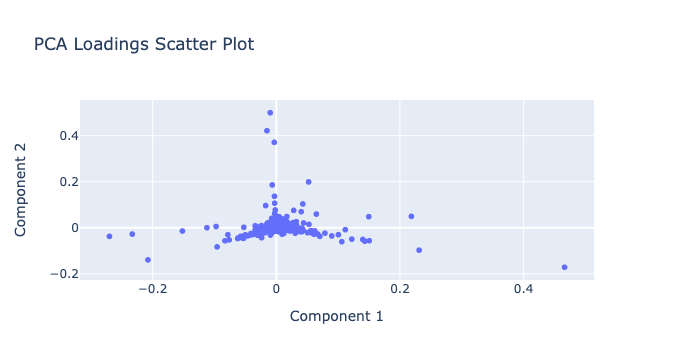

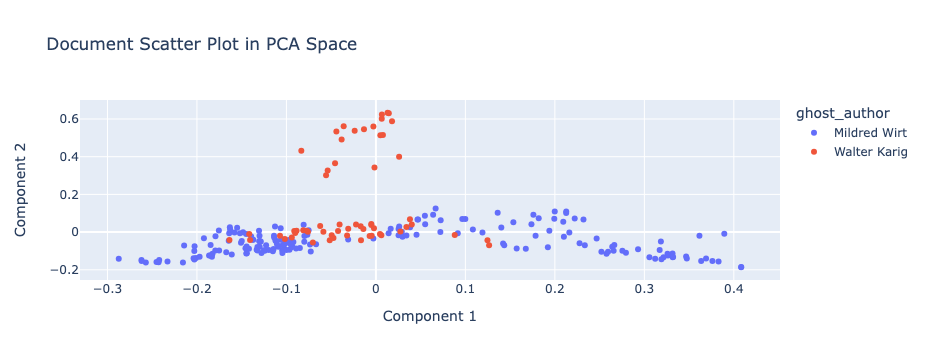


Briefly describe the nature of the polarity you see in the first component:

##### The polarity in the first component, as seen from the document scatter plot, indicates a fundamental stylistic or thematic dichotomy between the two authors. Given that Component 1 primarily separates the authors, it might be capturing aspects like usage of certain types of vocabulary, sentence structure, or narrative complexity which are consistently different between Wirt and Karig.

In [43]:
DOC = LIB.copy()  # add metadata
DOC = DOC.join(DCM) #add pca
DOC['PC1'] = DCM[0] 
DOC['PC2'] = DCM[1] 

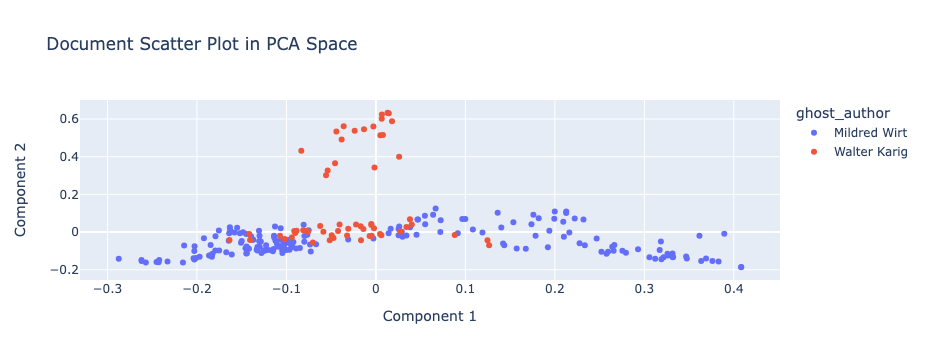

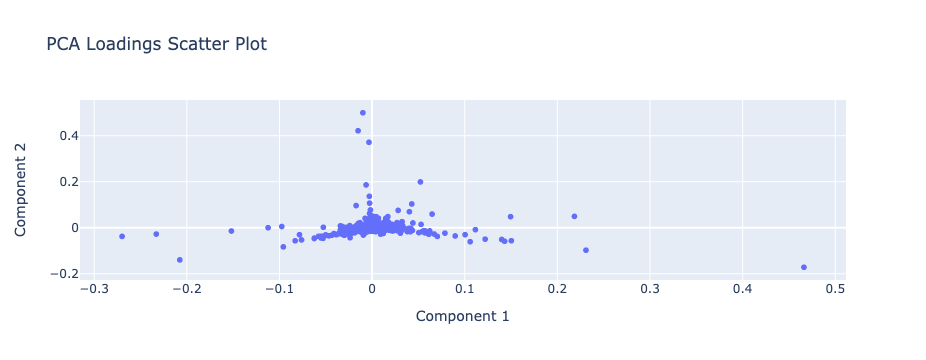

In [44]:
import plotly.express as px

# Visualization of documents in the space created by the first two PCA components
fig_docs = px.scatter(
    DOC.reset_index(), 
    x=0, 
    y=1, 
    color='ghost_author',
    labels={"0": "Component 1", "1": "Component 2"},
    title="Document Scatter Plot in PCA Space"
)
fig_docs.show()

# Visualization of loadings for the same two components
fig_loadings = px.scatter(
    x=LOADINGS.iloc[0],  # First component loadings
    y=LOADINGS.iloc[1],  # Second component loadings
    labels={'x': 'Component 1', 'y': 'Component 2'},
    title="PCA Loadings Scatter Plot"
)
fig_loadings.show()


## PCA Visualization 2 (4)

Include a scatterplot of documents in the space created by the second two components.

Color the points based on a metadata feature associated with the documents.

Also include a scatterplot of the loadings for the same two components. (This does not need a feature mapped onto color.)

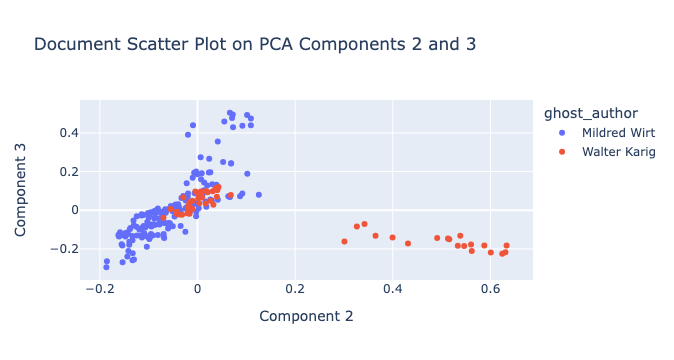


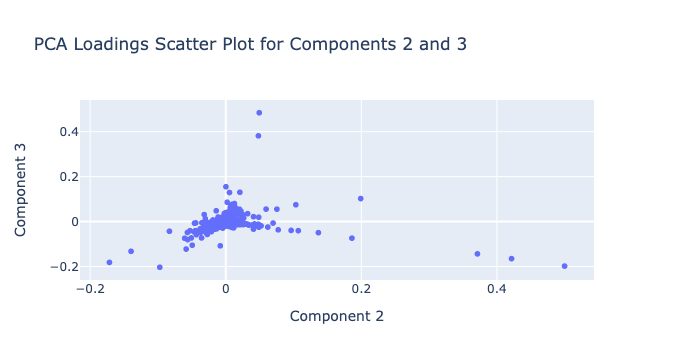

Briefly describe the nature of the polarity you see in the second component:

##### The relative positioning of documents along Component 2, where Karig's are predominantly on the negative side and Wirt’s scatter towards the center and positive side, suggests subtle stylistic or thematic variations. Component 2 might capture underlying differences in narrative techniques or the use of certain types of descriptions and settings that are less overt than those captured by Component 1.

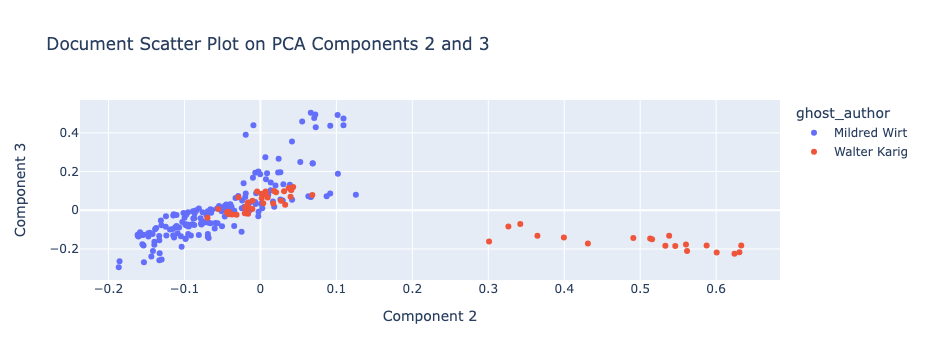

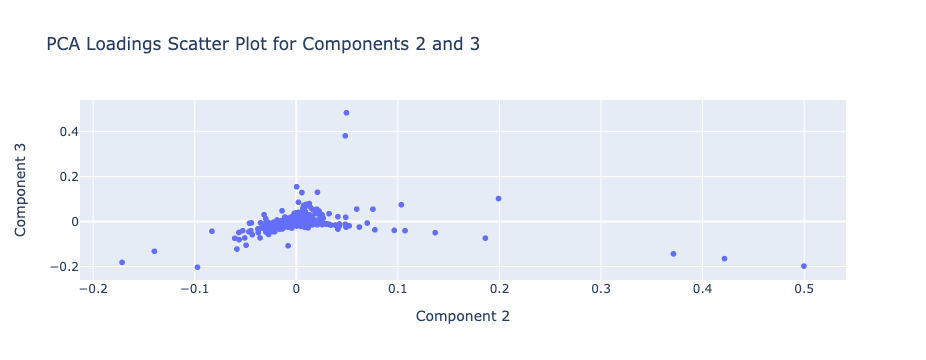

In [45]:
# Visualization of documents in the space created by the second and third PCA components
fig_docs = px.scatter(
    DOC.reset_index(), 
    x=1,  # Assuming the second PCA component is named '1'
    y=2,  # Assuming the third PCA component is named '2'
    color='ghost_author',  # Replace 'genre_id' with the actual metadata column name for coloring
    labels={"1": "Component 2", "2": "Component 3"},
    title="Document Scatter Plot on PCA Components 2 and 3"
)
fig_docs.show()

# Visualization of loadings for the second and third components
fig_loadings = px.scatter(
    x=LOADINGS.iloc[1],  # Second component loadings
    y=LOADINGS.iloc[2],  # Third component loadings
    labels={'x': 'Component 2', 'y': 'Component 3'},
    title="PCA Loadings Scatter Plot for Components 2 and 3"
)
fig_loadings.show()


## LDA TOPIC (4)

- UVA Box URL: https://virginia.box.com/s/shpyl5sie1cefby7cfg0qp84gvo5p2ty
- UVA Box URL of count matrix used to create: n/a
- GitHub URL for notebook used to create: https://github.com/gwenpowers1/ETA_finalproject/blob/main/FinalProject.ipynb
- Delimitter: ' '
- Libary used to compute: sklearn: CountVectorizer and LatentDirichletAllocation as LDA
- A description of any filtering, e.g. POS (Nouns and Verbs only): nouns and verbs only
- Number of components: 12
- Any other parameters used: max_features = 4000, max_iter = 10, stop_words = 'english'
- Top 5 words and best-guess labels for topic five topics by mean document weight:
T00: ['crowley' 'josiah' 'topham' 'judy' 'nancy']
T01: ['nancy' 'said' 'mr' 'man' 'mrs']
T02: ['nancy' 'said' 'mr' 'bess' 'asked']
T03: ['allison' 'grace' 'nancy' 'hoover' 'mascagni']
T04: ['nancy' 'said' 'girls' 'bess' 'house']
T05: ['nancy' 'said' 'inn' 'girls' 'maud']

In [46]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation as LDA

In [47]:
# Filtered corpus by POS tags focusing on nouns and verbs
filtered_corpus = CORPUS[CORPUS['pos'].isin(['NN', 'NNS', 'VB', 'VBD', 'VBG', 'VBN', 'VBP', 'VBZ'])]

# Aggregate text by chapters
docs = filtered_corpus.groupby(['book_id', 'chap_num']).term_str.apply(lambda terms: ' '.join(terms))

# CountVectorizer configuration
n_components = 6
max_features = 4000
max_iter = 10

vectorizer = CountVectorizer(max_features=max_features, stop_words='english')
data_vectorized = vectorizer.fit_transform(docs)

In [48]:
# LDA Model
lda_model = LDA(n_components=n_components, max_iter=max_iter, learning_method='online', random_state=0)
lda_model.fit(data_vectorized)

# Extract the words most relevant to each topic
words = np.array(vectorizer.get_feature_names_out())
topic_summaries = []

# Access the components (topic-term distribution)
for i, topic_weights in enumerate(lda_model.components_):
    top_words = words[np.argsort(topic_weights)[:-6:-1]]
    topic_summaries.append(" ".join(top_words))
    print(f"T{i:02d}: {top_words}")

T00: ['crowley' 'josiah' 'topham' 'judy' 'nancy']
T01: ['nancy' 'said' 'mr' 'man' 'mrs']
T02: ['nancy' 'said' 'mr' 'bess' 'asked']
T03: ['allison' 'grace' 'nancy' 'hoover' 'mascagni']
T04: ['nancy' 'said' 'girls' 'bess' 'house']
T05: ['nancy' 'said' 'inn' 'girls' 'maud']


## LDA THETA (4)

- UVA Box URL: https://virginia.box.com/s/shpyl5sie1cefby7cfg0qp84gvo5p2ty
- GitHub URL for notebook used to create: https://github.com/gwenpowers1/ETA_finalproject/blob/main/FinalProject.ipynb
- Delimitter: ' '

In [49]:
lda_theta = lda_model.fit_transform(data_vectorized)
THETA = pd.DataFrame(lda_theta, 
                        index=pd.MultiIndex.from_tuples([(b, c) for b, c in docs.index], names=['book_id', 'chap_num']),
                        columns=[f'Topic {i}' for i in range(n_components)])

THETA

Topic 0   Topic 1   Topic 2   Topic 3   Topic 4   Topic 5
book_id chap_num                                                            
1       1         0.311502  0.000256  0.687470  0.000257  0.000256  0.000258
        2         0.320370  0.000270  0.678547  0.000271  0.000270  0.000272
        3         0.211646  0.000243  0.521058  0.000243  0.000243  0.266567
        4         0.119693  0.000282  0.879175  0.000283  0.000282  0.000285
        5         0.000286  0.000284  0.515232  0.483626  0.000284  0.000287
...                    ...       ...       ...       ...       ...       ...
12      16        0.000267  0.000267  0.998663  0.000267  0.000267  0.000269
        17        0.000372  0.000372  0.998138  0.000372  0.000371  0.000375
        18        0.000323  0.000322  0.998387  0.000322  0.000322  0.000324
        19        0.000232  0.000232  0.998838  0.000232  0.000232  0.000234
        20        0.000208  0.000208  0.998960  0.000208  0.000207  0.000209

[237 rows x 6 columns]

## LDA PHI (4)

- UVA Box URL: https://virginia.box.com/s/shpyl5sie1cefby7cfg0qp84gvo5p2ty
- GitHub URL for notebook used to create: https://github.com/gwenpowers1/ETA_finalproject/blob/main/FinalProject.ipynb
- Delimitter: ' '

In [50]:
# Extract the feature names (words) from the vectorizer
terms = vectorizer.get_feature_names_out()

# Extract the topic-term matrix from the LDA model
topic_term_matrix = lda_model.components_

# Normalize the PHI matrix to probabilities
PHI = pd.DataFrame(topic_term_matrix, columns=terms, index=[f'Topic {i}' for i in range(n_components)])
PHI = PHI.div(PHI.sum(axis=1), axis=0)
PHI

,abandoned,abbott,abducted,abductors,aboard,abom,aboms,abreast,abrupt,absence,...,year,years,yell,yelled,yellow,yep,yes,yesterday,youth,yvonne
Topic 0,0.000095,0.000114,0.000094,0.000086,0.000092,0.000297,0.000129,0.000091,0.000093,0.000099,...,0.000148,0.001144,0.000086,0.000097,0.000094,0.000088,0.000280,0.000138,0.000094,0.000110
Topic 1,0.000205,0.000208,0.000219,0.000201,0.000219,0.000853,0.000326,0.000209,0.000205,0.000218,...,0.000255,0.000320,0.000237,0.000235,0.000208,0.000214,0.000301,0.000244,0.000211,0.000211
Topic 2,0.000090,0.000008,0.000041,0.000060,0.000102,0.001346,0.000300,0.000027,0.000046,0.000070,...,0.000325,0.000777,0.000091,0.000112,0.000173,0.000043,0.000399,0.000194,0.000076,0.000025
Topic 3,0.000151,0.000161,0.000149,0.000150,0.000185,0.000414,0.000179,0.000150,0.000157,0.000150,...,0.000564,0.000699,0.000170,0.000403,0.000162,0.000154,0.000238,0.000188,0.000164,0.000175
Topic 4,0.000224,0.000224,0.000220,0.000232,0.000254,0.000279,0.000250,0.000222,0.000219,0.000234,...,0.000237,0.000334,0.000236,0.000234,0.000235,0.000215,0.000235,0.000237,0.000231,0.000258
Topic 5,0.000023,0.001623,0.000017,0.000018,0.000315,0.000080,0.000031,0.000126,0.000017,0.000056,...,0.000177,0.000359,0.000019,0.000112,0.000055,0.000017,0.000248,0.000325,0.000018,0.001297


## LDA + PCA Visualization (4)

Apply PCA to the PHI table and plot the topics in the space opened by the first two components.

Size the points based on the mean document weight of each topic (using the THETA table).

Color the points based on a metadata feature from the LIB table.

Provide a brief interpretation of what you see.

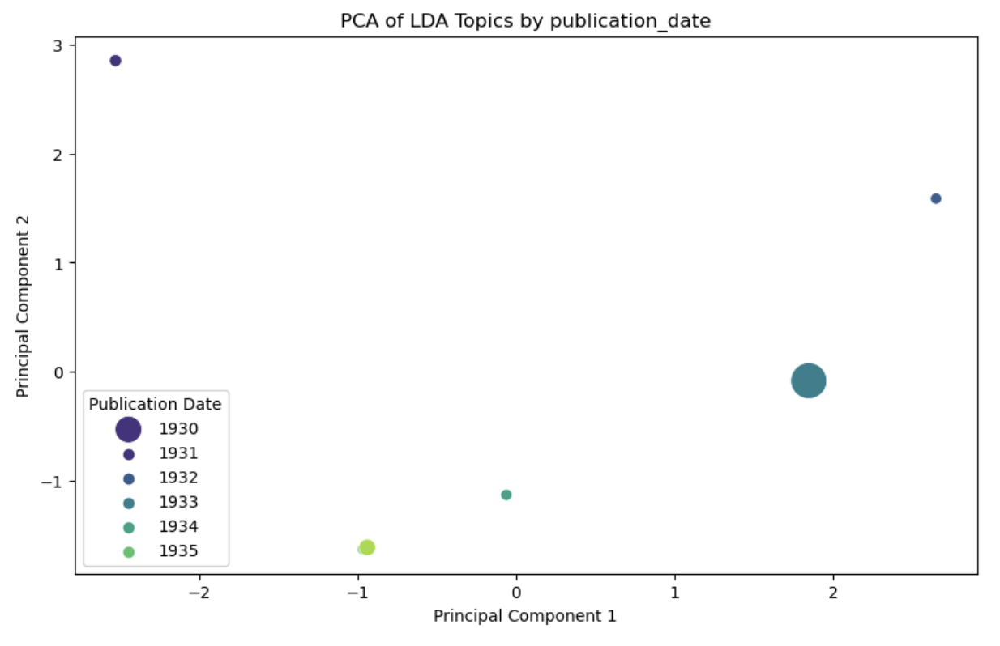

#####  The plot indicates that there might be underlying changes in the topics discussed or the way topics are approached in the texts over the years. For instance, the movement along Principal Component 1 might signify a gradual shift in focus or style, which could be related to changes in societal interests or ghost_authors.

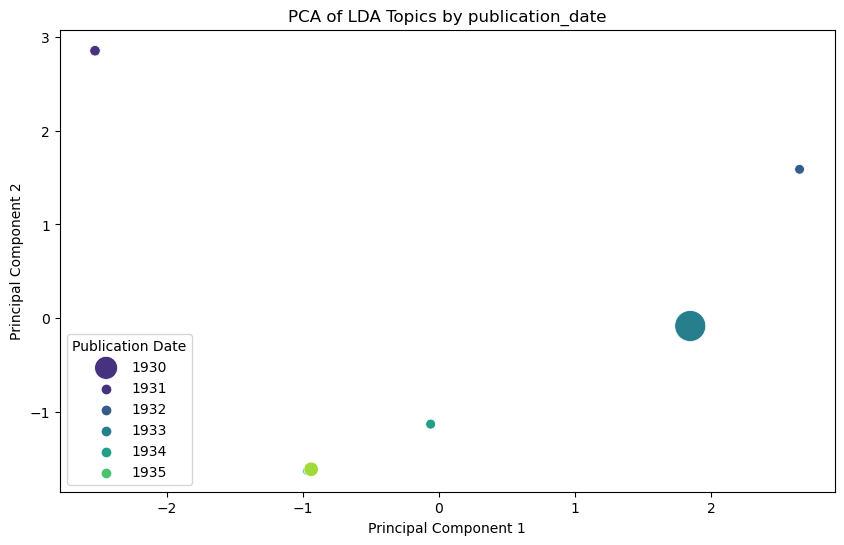

In [51]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Reset the index of THETA if necessary to make 'book_id' the only index
if 'chap_num' in THETA.index.names:
    theta_with_metadata = THETA.reset_index(level='chap_num', drop=True)
else:
    theta_with_metadata = THETA.copy()

# Ensure that each 'book_id' in THETA is unique for the join
theta_with_metadata = theta_with_metadata[~theta_with_metadata.index.duplicated(keep='first')]

# Join THETA with LIB to get the publication_date information
theta_with_metadata = theta_with_metadata.join(LIB['publication_date'])

# Group by publication_date to get the mean topic distributions per date
grouped_theta = theta_with_metadata.groupby('publication_date').mean()

# Get the mean document weight of each topic
mean_topic_weights = THETA.mean(axis=0).values

# Standardize the data for PCA
scaler = StandardScaler()
grouped_scaled = scaler.fit_transform(grouped_theta)

# Perform PCA
pca = PCA(n_components=2)
grouped_pca = pca.fit_transform(grouped_scaled)
grouped_pca_df = pd.DataFrame(grouped_pca, columns=['PC1', 'PC2'], index=grouped_theta.index)

# Plot
plt.figure(figsize=(10, 6))

# Each point represents a topic, colored by the publication_date
# Size of the points is based on the mean document weight of each topic
scatter = sns.scatterplot(x='PC1', y='PC2', hue=grouped_pca_df.index, data=grouped_pca_df, palette='viridis', size=mean_topic_weights, sizes=(50, 500))

# Adding legend with title
legend_labels = [str(date)[:4] for date in grouped_pca_df.index]
scatter.legend(title='Publication Date', labels=legend_labels)

# Adding labels and title
plt.title('PCA of LDA Topics by publication_date')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

# Show the plot
plt.show()


## Sentiment VOCAB_SENT (4)

Sentiment values associated with a subset of the VOCAB from a curated sentiment lexicon.

- UVA Box URL: https://virginia.box.com/s/shpyl5sie1cefby7cfg0qp84gvo5p2ty
- UVA Box URL for source lexicon: 
- GitHub URL for notebook used to create: https://github.com/gwenpowers1/ETA_finalproject/blob/main/FinalProject.ipynb
- Delimitter: ' '

In [52]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer

In [53]:
# Initialize VADER sentiment analyzer
sid = SentimentIntensityAnalyzer()

# Adjust thresholds
positive_threshold = 0.01
negative_threshold = -0.01

# Initialize an empty DataFrame to store sentiment scores for words in VOCAB
VOCAB_SENT = pd.DataFrame(index=VOCAB.index, columns=['Sentiment_Score'])

# Iterate through each word in VOCAB
for word in VOCAB.index:
    # Get sentiment score for the word from VADER
    sentiment_score = sid.polarity_scores(word)['compound']
    
    # Adjust sentiment score based on thresholds
    if sentiment_score > positive_threshold:
        sentiment_category = 'Positive'
    elif sentiment_score < negative_threshold:
        sentiment_category = 'Negative'
    else:
        sentiment_category = 'Neutral'
    
    # Assign the sentiment score to VOCAB_SENT
    VOCAB_SENT.at[word, 'Sentiment_Score'] = sentiment_score
    VOCAB_SENT.at[word, 'Sentiment_Category'] = sentiment_category

In [54]:
VOCAB_SENT.sample(10)

,Sentiment_Score,Sentiment_Category
term_str,,
twins,0.0,Neutral
posture,0.0,Neutral
solving,0.34,Positive
mechanical,0.0,Neutral
ignore,-0.3612,Negative
med,0.0,Neutral
avoids,-0.1779,Negative
sign,0.0,Neutral
waterfall,0.0,Neutral


## Sentiment BOW_SENT (4)

Sentiment values from VOCAB_SENT mapped onto BOW.

- UVA Box URL: https://virginia.box.com/s/shpyl5sie1cefby7cfg0qp84gvo5p2ty
- GitHub URL for notebook used to create: https://github.com/gwenpowers1/ETA_finalproject/blob/main/FinalProject.ipynb
- Delimitter: ' '

In [55]:
# Merge sentiment scores into the BOW DataFrame
BOW_SENT = BOW.reset_index().merge(
    VOCAB_SENT, 
    left_on='term_str', 
    right_index=True,
    how='left'
)

# Compute the sentiment for each term as the product of term frequency and sentiment score
BOW_SENT['term_sentiment'] = BOW_SENT['n'] * BOW_SENT['Sentiment_Score']

# Reset the index to match the BOW structure
BOW_SENT.set_index(['book_id', 'chap_num', 'term_str'], inplace=True)

In [56]:
BOW_SENT

n     tfidf Sentiment_Score Sentiment_Category  \
book_id chap_num term_str                                                    
1       1        able       4  0.008747             0.0            Neutral   
                 across     2  0.003853             0.0            Neutral   
                 ada        2  0.008881             0.0            Neutral   
                 address    1  0.002991             0.0            Neutral   
                 advancing  1  0.005723             0.0            Neutral   
...                        ..       ...             ...                ...   
12      20       xx         1  0.003348             0.0            Neutral   
                 yard       1  0.002722             0.0            Neutral   
                 yes        1  0.001091          0.4019           Positive   
                 york       1  0.002788             0.0            Neutral   
                 young      6  0.006062             0.0            Neutral   

                           term_sentiment  
book_id chap_num term_str                  
1       1        able                 0.0  
                 across               0.0  
                 ada                  0.0  
                 address              0.0  
                 advancing            0.0  
...                                   ...  
12      20       xx                   0.0  
                 yard                 0.0  
                 yes               0.4019  
                 york                 0.0  
                 young                0.0  

[124263 rows x 5 columns]

## Sentiment DOC_SENT (4)

Computed sentiment per bag computed from BOW_SENT.

- UVA Box URL: https://virginia.box.com/s/shpyl5sie1cefby7cfg0qp84gvo5p2ty
- GitHub URL for notebook used to create: https://github.com/gwenpowers1/ETA_finalproject/blob/main/FinalProject.ipynb
- Delimitter: ' '
- Document bag expressed in terms of OHCO levels: (book_id, chap_num)

In [57]:
# Compute the weighted sentiment score for each term in each document
BOW_SENT['weighted_sentiment'] = BOW_SENT['tfidf'] * BOW_SENT['Sentiment_Score']

# Aggregate these weighted sentiment scores at the document level
DOC_SENT = BOW_SENT.groupby(['book_id', 'chap_num']).apply(
    lambda df: np.sum(df['weighted_sentiment']) / np.sum(df['tfidf']) if np.sum(df['tfidf']) != 0 else 0
).reset_index(name='avg_sentiment')

In [58]:
DOC_SENT

,book_id,chap_num,avg_sentiment
0,1,1,0.009882
1,1,2,0.012188
2,1,3,0.000153
3,1,4,0.015020
4,1,5,0.048459
...,...,...,...
232,12,16,0.001705
233,12,17,-0.000316
234,12,18,-0.002592
235,12,19,0.002784


## Sentiment Plot (4)

Plot sentiment over some metric space, such as time.

If you don't have a metric metadata features, plot sentiment over a feature of your choice.

You may use a bar chart or a line graph.

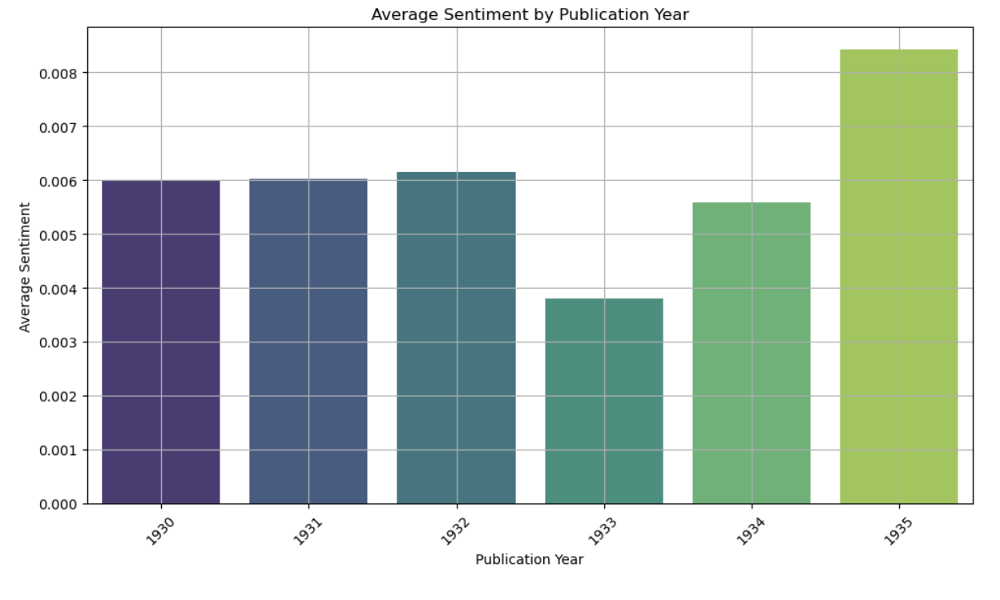

##### This bar chart shows the average sentiment of Nancy Drew books by publication year, illustrating an increasing trend in positive sentiment over time. Notably, the years 1934 and 1935 show a marked increase in positivity compared to earlier years, suggesting a shift in narrative tone or content in the books published during those years.

In [59]:
import matplotlib.pyplot as plt
import seaborn as sns

# Merge DOC_SENT with the publication dates from LIB
merged_data = DOC_SENT.merge(LIB[['publication_date']], left_on='book_id', right_index=True, how='left')

# Group by publication_date to calculate the mean sentiment
grouped_data = merged_data.groupby('publication_date')['avg_sentiment'].mean().reset_index()

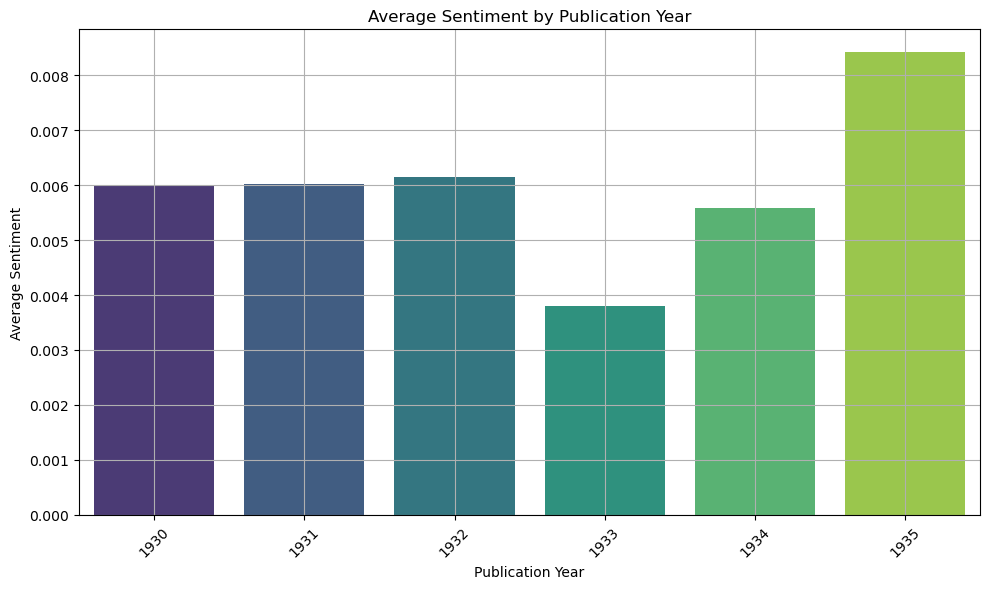

In [60]:
# Plot
plt.figure(figsize=(10, 6))
sns.barplot(data=grouped_data, x='publication_date', y='avg_sentiment', palette='viridis')
plt.title('Average Sentiment by Publication Year')
plt.xlabel('Publication Year')
plt.ylabel('Average Sentiment')
plt.xticks(rotation=45)  # Rotate labels to avoid overlap
plt.grid(True)
plt.tight_layout()
plt.show()

## VOCAB_W2V (4)

A table of word2vec features associated with terms in the VOCAB table.

- UVA Box URL: https://virginia.box.com/s/shpyl5sie1cefby7cfg0qp84gvo5p2ty
- GitHub URL for notebook used to create: https://github.com/gwenpowers1/ETA_finalproject/blob/main/FinalProject.ipynb
- Delimitter: ' '
- Document bag expressed in terms of OHCO levels: ['book_id', 'chap_num']
- Number of features generated: 256
- The library used to generate the embeddings: Word2Vec, TSNE

In [61]:
from gensim.models import Word2Vec
from sklearn.manifold import TSNE
import plotly.express as px

class W2VExplorer:
    
    w2v_min_count = 10
    w2v_workers = 4
    w2v_size = 256
    w2v_window = 2
    tsne_perplexity = 40
    tsne_n_components = 2
    tsne_init = 'pca'
    tsne_n_iter = 2500
    tsne_random_state = 23
        
    def __init__(self, tokens, vocab, bag):
        self.TOKENS = tokens
        self.VOCAB = vocab
        self.BAG = bag
        
    def generate_model(self):
        print("Bag:", self.BAG[-1])
        print('Getting DOCS')
        self._get_docs()
        print("Getting MODEL")
        self._get_model()
        print("Filtering VOCAB terms and getting Embeddings")
        self._get_embeddings()
        print("Getting tSNE Coords")
        self._get_tsne_coords()
        print(u'\u2713')  # Checkmark
        return self
        
    def _get_docs(self):
        """Create a list of documents for Gensim, ensuring only terms in VOCAB are included."""
        self.DOCS = self.TOKENS[self.TOKENS.term_str.isin(self.VOCAB.index)].groupby(self.BAG)\
            .term_str.apply(lambda x: x.tolist())\
            .reset_index()['term_str'].tolist()
        
    def _get_model(self):
        """Run Word2Vec against the docs."""
        self.model = Word2Vec(self.DOCS, 
                              vector_size=self.w2v_size, 
                              window=self.w2v_window, 
                              min_count=self.w2v_min_count, 
                              workers=self.w2v_workers)

    def _get_embeddings(self):
        """Extract embeddings for terms that are present in both model and VOCAB."""
        self.embeddings = {word: self.model.wv[word] for word in self.model.wv.key_to_index if word in self.VOCAB.index}
        
    def _get_tsne_coords(self):
        """Run t-SNE on the filtered embeddings."""
        embeddings_df = pd.DataFrame(list(self.embeddings.values()), index=self.embeddings.keys())
        self.tsne_model = TSNE(perplexity=self.tsne_perplexity, 
                               n_components=self.tsne_n_components, 
                               init=self.tsne_init, 
                               n_iter=self.tsne_n_iter, 
                               random_state=self.tsne_random_state)
        tsne_results = self.tsne_model.fit_transform(embeddings_df)
        self.coords = pd.DataFrame(tsne_results, columns=['x', 'y'], index=embeddings_df.index)
        
    def plot_tsne(self):
        """Plot t-SNE results using Plotly."""
        fig = px.scatter(self.coords, 'x', 'y', text=self.coords.index)
        fig.update_traces(textposition='top center')
        fig.show()


In [62]:
w2v_explorer = W2VExplorer(CORPUS, VOCAB, ['book_id', 'chap_num'])
w2v_explorer.generate_model()

Bag: chap_num
Getting DOCS
Getting MODEL
Filtering VOCAB terms and getting Embeddings
Getting tSNE Coords
✓


In [63]:
VOCAB_W2V = pd.DataFrame(list(w2v_explorer.embeddings.values()), index=w2v_explorer.embeddings.keys())
VOCAB_W2V

,0,1,2,3,4,5,6,7,8,9,...,246,247,248,249,250,251,252,253,254,255
nancy,-0.041725,-0.250635,0.211895,0.157962,0.179421,-0.215358,0.334080,-0.083792,-0.186330,-0.028573,...,0.043403,0.043578,-0.015625,-0.226808,-0.072589,0.072934,-0.182000,-0.093298,-0.204457,0.035888
said,-0.059110,-0.139389,0.033518,0.078090,0.145471,-0.061504,0.335010,-0.087538,-0.007017,-0.125390,...,0.034553,-0.008561,-0.154133,-0.286676,-0.095421,0.100883,-0.140060,-0.149439,-0.210722,0.018937
mr,-0.248844,-0.510571,0.119796,0.126023,0.207520,-0.491367,0.530153,0.062093,-0.383689,-0.124994,...,0.003484,0.140211,0.278611,-0.399584,-0.153442,0.217416,-0.217322,-0.168747,-0.332667,0.195877
one,0.036998,-0.236190,0.135147,0.154390,0.271490,-0.036534,0.146988,-0.068159,-0.194207,0.153425,...,0.073323,0.169819,-0.168883,-0.156202,-0.170924,0.222647,-0.356486,-0.011084,-0.282835,0.017971
girls,0.072610,-0.195261,0.168061,0.160317,0.307227,-0.069263,0.094019,-0.074561,-0.198076,0.209068,...,0.100281,0.204626,-0.186806,-0.144355,-0.225814,0.270400,-0.414728,-0.022821,-0.354867,0.036025
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
consciousness,0.006409,-0.053106,0.029581,0.040336,0.066419,-0.012010,0.049590,-0.023451,-0.037504,0.024304,...,0.016214,0.033026,-0.044418,-0.042851,-0.040363,0.047522,-0.074242,-0.014671,-0.070715,0.000640
anger,0.007953,-0.072550,0.044307,0.047752,0.082526,-0.016885,0.063785,-0.025891,-0.051146,0.029782,...,0.024202,0.044457,-0.049998,-0.060085,-0.053842,0.070980,-0.100428,-0.012858,-0.087665,0.004281
ugly,0.001618,-0.066899,0.044472,0.046069,0.076061,-0.017210,0.067936,-0.024927,-0.049653,0.026626,...,0.019484,0.044073,-0.044009,-0.057013,-0.050064,0.062281,-0.095188,-0.018575,-0.083936,0.001783
mill,0.007241,-0.060457,0.037401,0.045162,0.077338,-0.019876,0.060813,-0.024373,-0.048307,0.032954,...,0.019804,0.040068,-0.049983,-0.051050,-0.048441,0.061529,-0.094124,-0.014004,-0.078213,0.002840


## Word2vec tSNE Plot (4)

Plot word embedding featues in two-dimensions using t-SNE.

Describe a cluster in the plot that captures your attention.
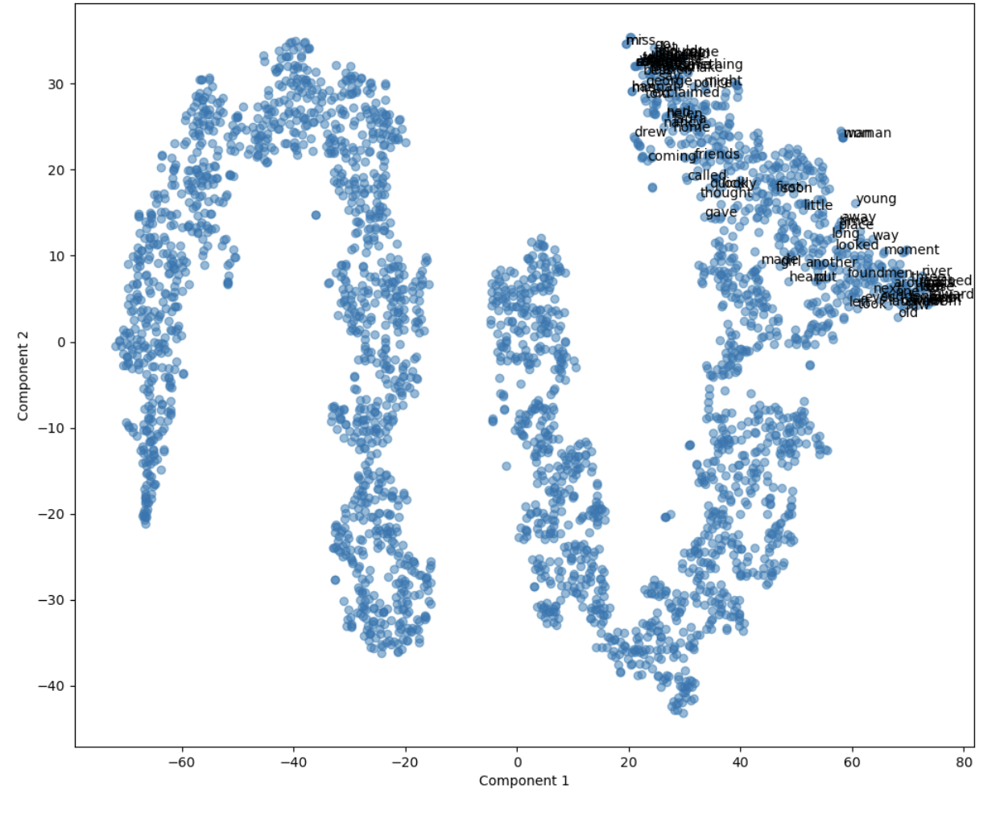

##### The cluster on the right-hand side of the plot captures attention due to its concentration of words like "drew," "coming," "friends," and "home," which seem to relate to personal relationships and actions. This suggests that these terms are closely related in the context of the dataset, possibly indicating frequent narrative elements around character interactions and development.

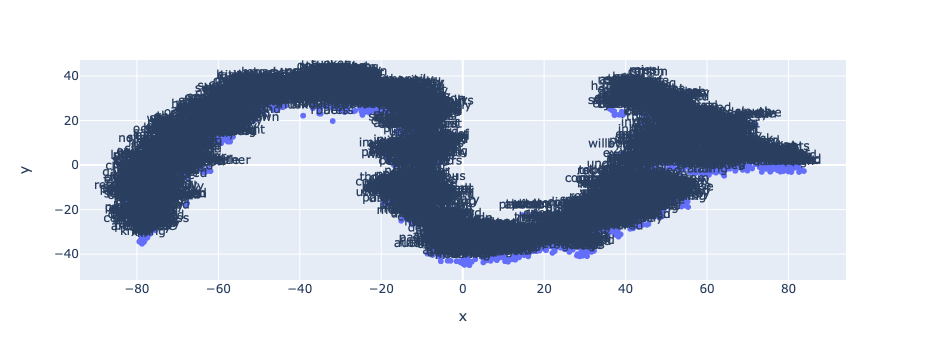

In [64]:
w2v_explorer.plot_tsne() #difficult to interpret so trying another way

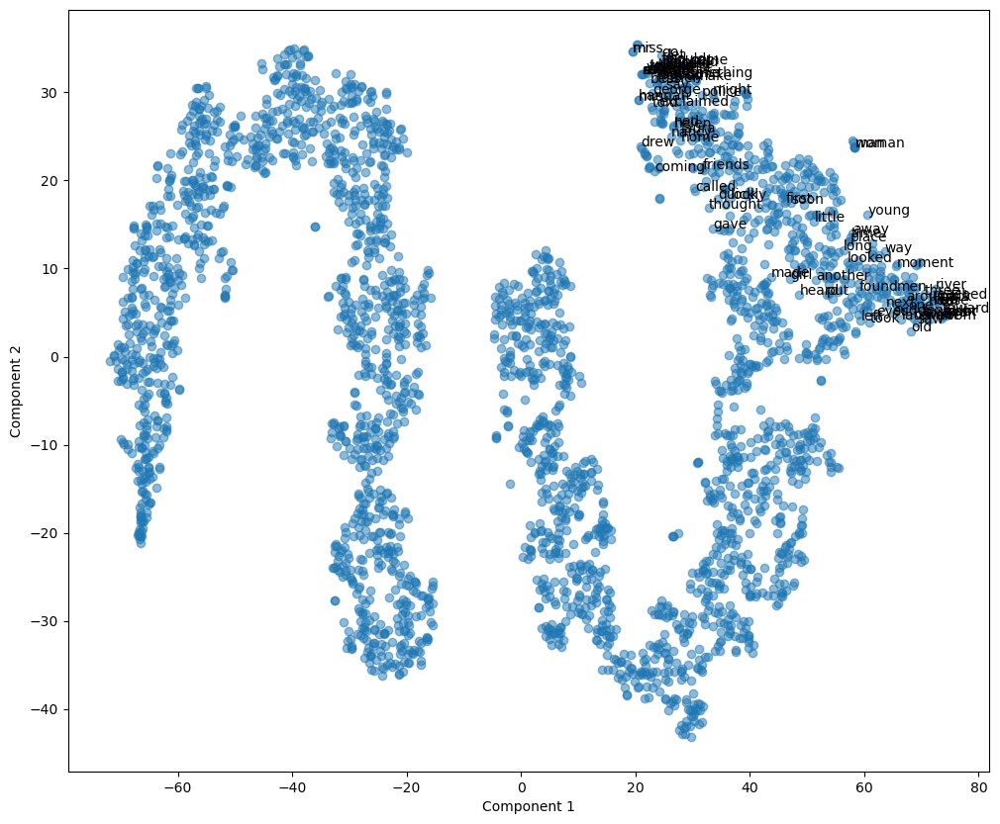

In [65]:
tsne = TSNE(n_components=2, random_state=42)
tsne_results = tsne.fit_transform(VOCAB_W2V)

# Plotting
plt.figure(figsize=(12, 10))
plt.scatter(tsne_results[:, 0], tsne_results[:, 1], alpha=0.5)
words = list(VOCAB_W2V.index)
# Optionally, limit the number of words annotated to avoid clutter
for i, word in enumerate(words[:100]):  # Adjust the slice as needed
    plt.annotate(word, (tsne_results[i, 0], tsne_results[i, 1]))
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.show()


# Riffs

Provde at least three visualizations that combine the preceding model data in interesting ways.

These should provide insight into how features in the LIB table are related. 

The nature of this relationship is left open to you -- it may be correlation, or mutual information, or something less well defined. 

In doing so, consider the following visualization types:

- Hierarchical cluster diagrams
- Heatmaps
- Scatter plots
- KDE plots
- Dispersion plots
- t-SNE plots
- etc.

## Riff 1 (5)

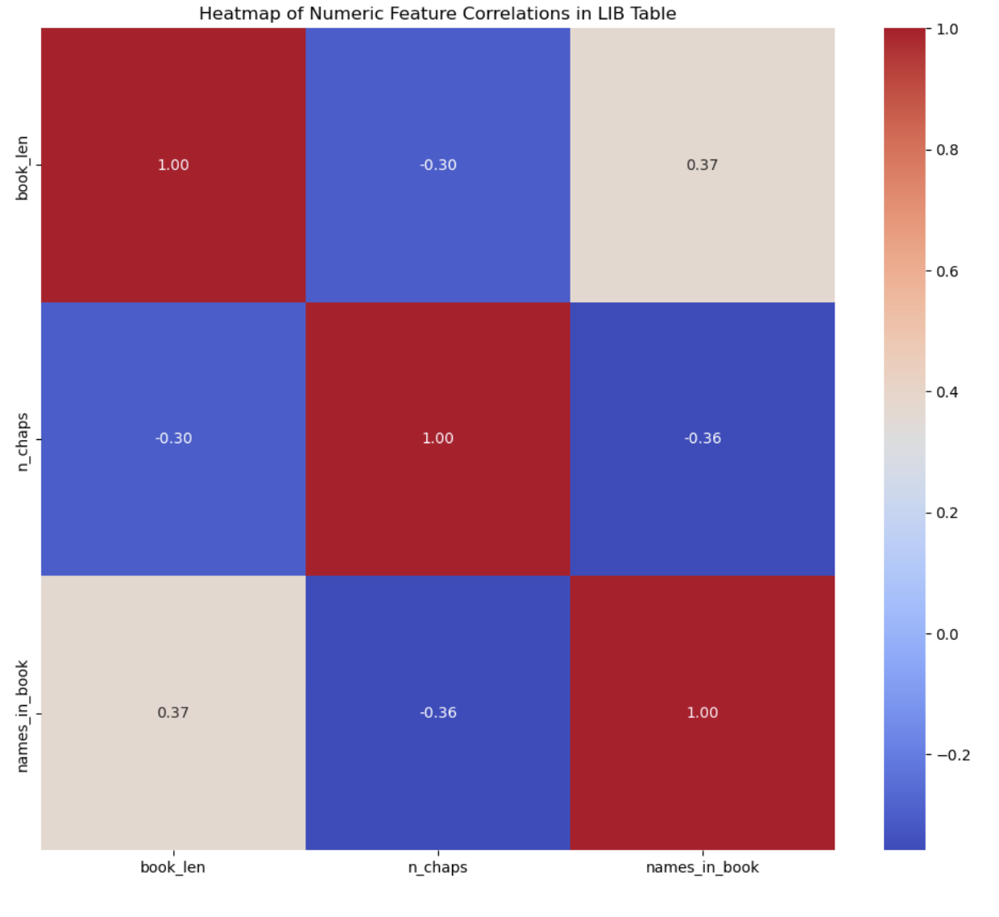

The heatmap indicates that longer books tend to feature more unique proper names, suggesting they likely cover broader narratives or a larger cast of characters. Additionally, books with more chapters tend to have fewer unique names per chapter, implying a focus on plot development over character introduction in densely structured narratives.

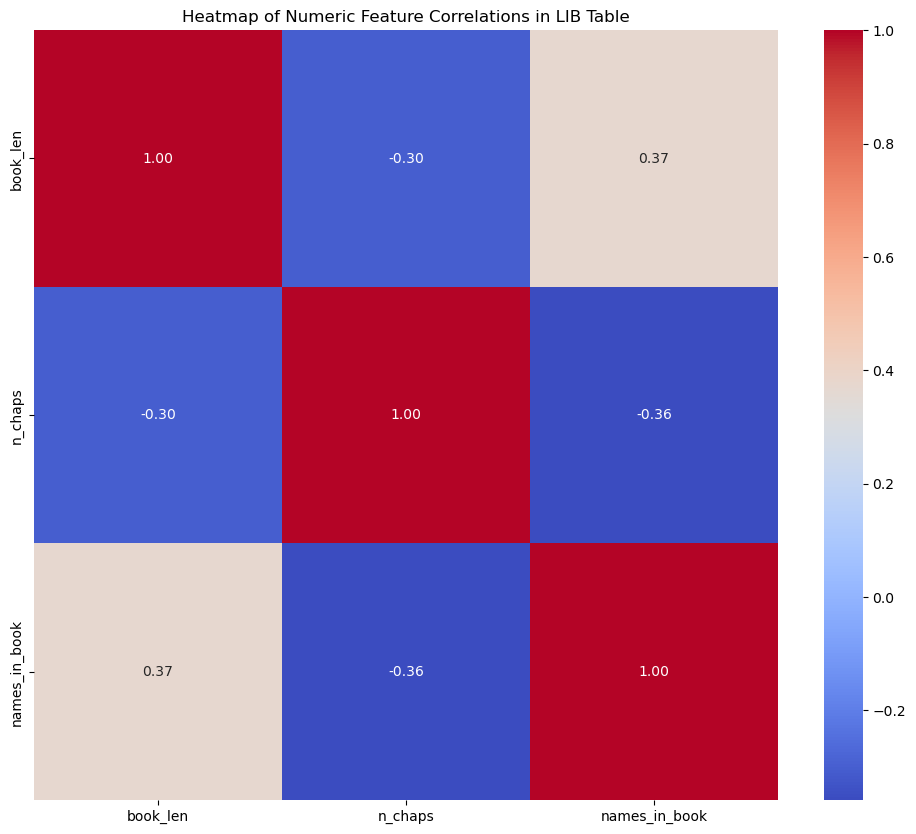

In [66]:
corr = LIB.corr(numeric_only=True)

plt.figure(figsize=(12, 10))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Heatmap of Numeric Feature Correlations in LIB Table')
plt.show()


## Riff 2 (5)

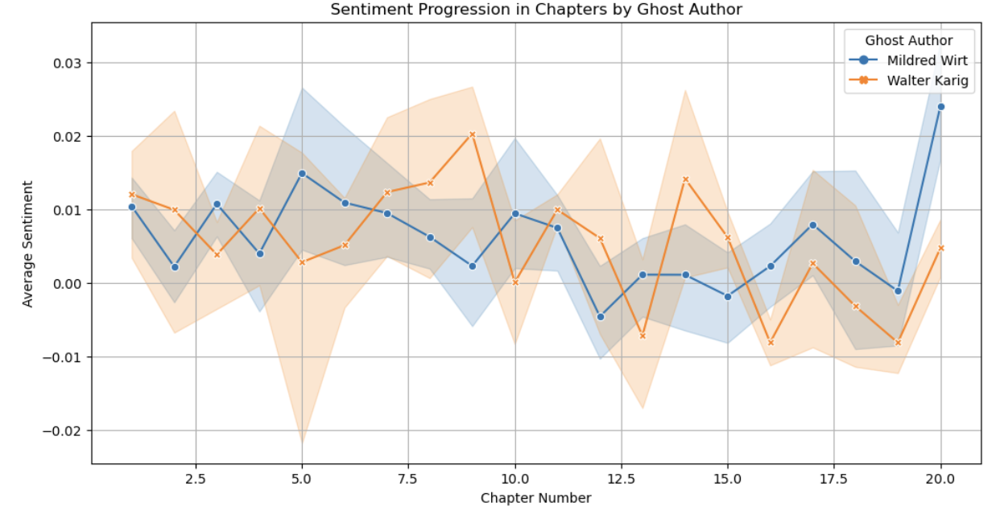

##### This plot illustrates the sentiment progression through the chapters of Nancy Drew books, comparing the narrative tones of books written by two different ghost authors, Mildred Wirt and Walter Karig. It shows fluctuating sentiment levels across chapters, with Mildred Wirt's chapters generally displaying more neutral to positive sentiment, and Walter Karig's showing greater variability and a noticeable rise in positive sentiment towards the end of the books.

In [67]:
merged_data = DOC_SENT.merge(LIB[['ghost_author']], left_on='book_id', right_index=True, how='left')


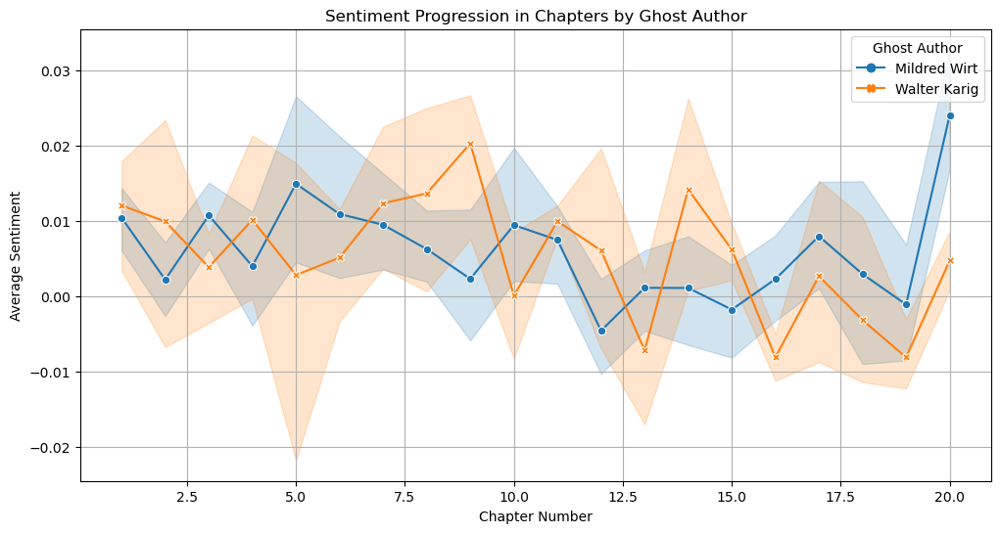

In [68]:
grouped_data = merged_data.groupby(['book_id','chap_num', 'ghost_author'])['avg_sentiment'].mean().reset_index()

# Plotting
plt.figure(figsize=(12, 6))
sns.lineplot(
    data=grouped_data,
    x='chap_num',
    y='avg_sentiment',
    hue='ghost_author', 
    style='ghost_author', 
    markers=True,  
    dashes=False  
)
plt.title('Sentiment Progression in Chapters by Ghost Author')
plt.xlabel('Chapter Number')
plt.ylabel('Average Sentiment')
plt.legend(title='Ghost Author')
plt.grid(True)
plt.show()

## Riff 3 (5)

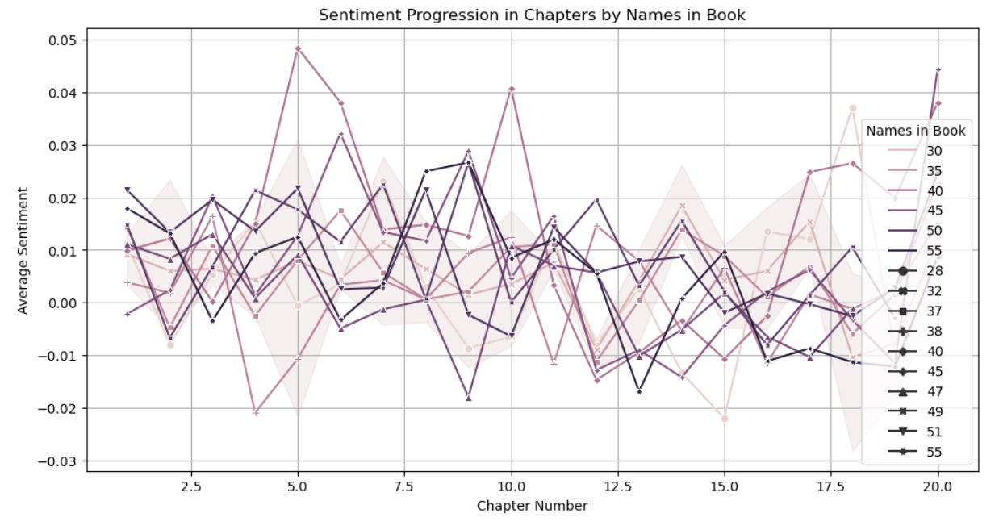

##### This plot depicts the progression of average sentiment in chapters of Nancy Drew books and correlates it with the number of unique names mentioned in each book. The sentiment fluctuates significantly across chapters, and while there's no clear linear relationship, books with a higher count of unique names tend to have chapters with higher positive sentiment peaks and more pronounced sentiment variations.

In [69]:
merged_data = DOC_SENT.merge(LIB[['names_in_book']], left_on='book_id', right_index=True, how='left')


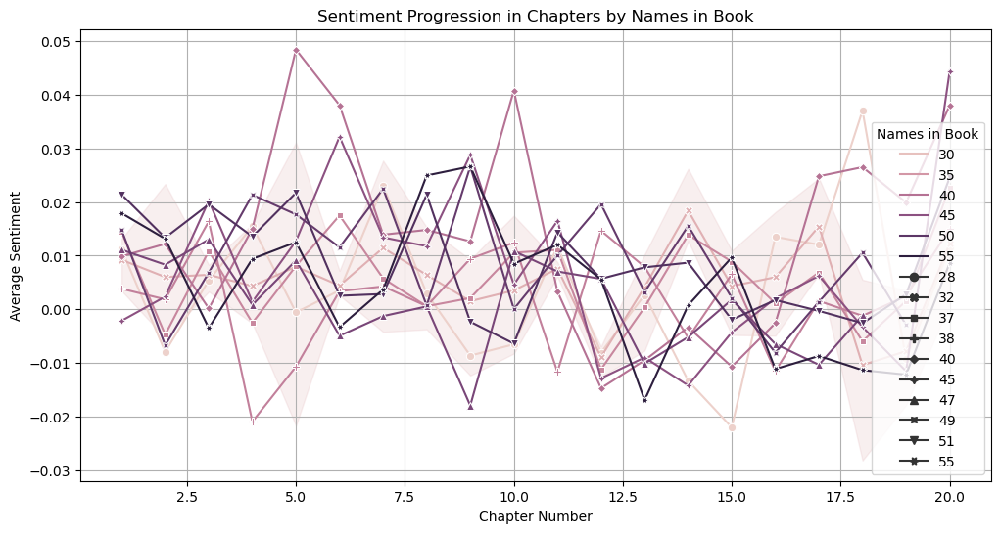

In [70]:
grouped_data = merged_data.groupby(['book_id','chap_num', 'names_in_book'])['avg_sentiment'].mean().reset_index()

# Plotting
plt.figure(figsize=(12, 6))
sns.lineplot(
    data=grouped_data,
    x='chap_num',
    y='avg_sentiment',
    hue='names_in_book', 
    style='names_in_book', 
    markers=True,  
    dashes=False  
)
plt.title('Sentiment Progression in Chapters by Names in Book')
plt.xlabel('Chapter Number')
plt.ylabel('Average Sentiment')
plt.legend(title='Names in Book')
plt.grid(True)
plt.show()

# Interpretation (4)

Describe something interesting about your corpus that you discovered during the process of completing this assignment.

At a minumum, use 250 words, but you may use more. You may also add images if you'd like.

##### Throughout the process of analyzing the Nancy Drew mystery novels corpus, it was interesting to see how the narrative elements and writing styles shifted across different books attributed to different ghost authors. The distinct narrative voices of Mildred Wirt and Walter Karig were highlighted through sentiment analysis and thematic exploration using unsupervised learning models like PCA and LDA.

##### Firstly, the sentiment analysis across chapters revealed fluctuations that corresponded with significant events or climactic points within the stories. However, more interesting was the variance in sentiment when mapped against the ghost authors. Mildred Wirt’s chapters generally exhibited a more stable and positive sentiment trajectory, suggesting a narrative style that favored resolutions that were less tumultuous. In contrast, Walter Karig’s contributions displayed a more volatile sentiment pattern, indicating the introduction of dramatic twists and complexities. In addition to different writing styles, this observation could reflect differing approaches to engaging young readers or perhaps editorial directions at different times.

##### Going more into writing styles, applying PCA to the text data helped uncover underlying stylistic differences between the authors. The PCA plots clearly separated the chapters written by Wirt and Karig, suggesting that despite writing under the same pseudonym Carolyn Keene, their personal writing styles and thematic focuses influenced the narrative significantly. For instance, Wirt’s narratives were often grounded in practical and moral lessons, while Karig’s stories leaned towards adventurous and sometimes ethereal themes.

##### The LDA model further supported these findings by identifying dominant topics that corresponded closely with the thematic elements associated with each author. For example, topics related to adventure, mystery, and friendship were prevalent, but their associations with specific terms varied by author, suggesting different narrative focuses and language use.

##### Exploring one of my favorite childhood book series through text analysis highlighted the richness of these books and potential of digital humanities tools to dissect and understand literature deeply, giving insights into how books varied throughout the series despite the common pen name. The ability to quantitatively parse out these nuances allowed me to truly appreciate the series' development over time and its cultural and literary significance.






